# Instalación de librerias

In [ ]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.5 MB/s eta 0:00:00


# Importación de librerias

In [ ]:
# Acceso a carpetas de sistema
import os
# Herramientas de torch
import torch
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision.datasets import CocoDetection, VisionDataset
# Herramientas transformers
from transformers import DetrForObjectDetection, DetrImageProcessor
# Herramientas manejo de imagenes
from PIL import Image
# Acceso a Roboflow
from getpass import getpass
from roboflow import Roboflow as rf
import albumentations as A
#from albumentations.pytorch.transforms import ToTensorV2
from albumentations.pytorch import ToTensorV2
from pycocotools.coco import COCO
from coco_eval import CocoEvaluator
import supervision as sv
import pytorch_lightning as pl
# Auxiliares
import random
import cv2
import numpy as np
import torchvision.transforms as T
import matplotlib.pyplot as plt
from IPython.display import display
import numpy as np
from collections import defaultdict

# Configuraciones

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model_repo = "facebook/detr-resnet-50"
conf_tresh =0.5
iou_thesh = 0.75

# Carga del modelo y del procesador

In [ ]:
image_processor = DetrImageProcessor.from_pretrained(model_repo)
model = DetrForObjectDetection.from_pretrained(model_repo)
model.to(device)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

# Api Key para conexión a roboflow

Esta herramienta permite la interacción con la plataforma y facilita la carga de los folders

In [ ]:
ROBOFLOW_API_KEY = getpass('Enter ROBOFLOW_API_KEY secret value: ')

Enter ROBOFLOW_API_KEY secret value: ··········


# Preparación de las carpetas de trabajo

In [ ]:
rf = rf(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("project-gvpak").project("container-detection-1v0zy")
version = project.version(7)
dataset = version.download("coco")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Container-Detection-7 in coco:: 100%|██████████| 2198/2198 [00:00<00:00, 3427.75it/s]


In [ ]:
dataset.location

'/content/Container-Detection-7'

# EDA

In [ ]:
def display_random_images_folder(root_path, samples_per_folder=5):
    """
    Muestra imagenes aleatorias de cada clase, considerando que .

    Parameters:
    - root_path: Ruta, La ruta al directorio raíz que contiene la información.
    - samples_per_folder: Númoro de muestras a mostrar por cada subcarpeta/clase (default is 5).
    """

    labels = os.listdir(root_path)

    fig = plt.figure(figsize=(20, 15))

    for row_index in range(len(labels)):
        subdirectory = str(row_index + 1)
        folder_path = os.path.join(root_path, labels[row_index])

        if os.path.isdir(folder_path):  # Check if the path is a directory
            # Get all files in the folder
            all_files = os.listdir(folder_path)
            # Filter out only image files (e.g., .jpg, .png)
            images = [f for f in all_files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            for sample_index in range(samples_per_folder):
                if images:  # Ensure there are images to sample
                    random_number = random.randint(0, len(images) - 1)
                    image_path = os.path.join(folder_path, images[random_number])
                    image = cv2.imread(image_path)

                    # Check if image was loaded successfully
                    if image is not None:
                        ax = fig.add_subplot(len(labels), samples_per_folder, samples_per_folder * row_index + sample_index + 1)
                        ax.axis("off")
                        ax.set_title(str(labels[row_index]))
                        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                    else:
                        print(f"Could not load image: {image_path}")

    plt.tight_layout()
    plt.show()

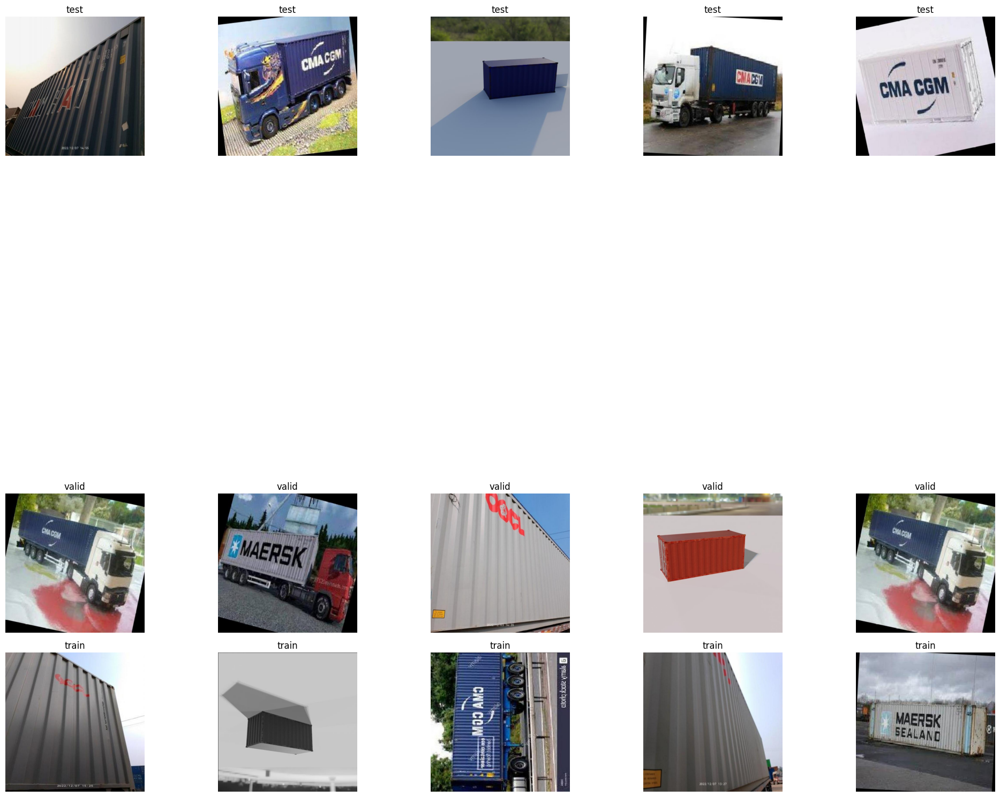

In [ ]:
root_path = r"/content/Container-Detection-7"
# Ploteo de la muestra
display_random_images_folder(root_path)

In [ ]:
def image_dimensions_scatterplot(folder_path):
    """
    Genera un scatterplot por subcarpeta mostrando las dimensiones de las imágenes.

    Args:
        folder_path (str): Ruta a la carpeta principal (e.g., 'containers').

    Returns:
        None: Muestra el scatterplot en una cuadrícula 1x3.
    """
    subfolders = ['train', 'test', 'valid']
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    for idx, subfolder in enumerate(subfolders):
        subfolder_path = os.path.join(folder_path, subfolder)
        widths, heights = [], []

        if not os.path.exists(subfolder_path):
            print(f"Subcarpeta no encontrada: {subfolder}")
            continue

        for image_name in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_name)

            # Leer la imagen
            image = cv2.imread(image_path)
            if image is None:
                print(f"No se pudo leer la imagen: {image_path}")
                continue

            # Extraer dimensiones
            height, width = image.shape[:2]
            widths.append(width)
            heights.append(height)

        # Scatterplot para la subcarpeta
        axes[idx].scatter(widths, heights, alpha=0.7, s=20)
        axes[idx].set_title(f'Dimensiones de {subfolder}', fontsize=14)
        axes[idx].set_xlabel('Ancho (px)', fontsize=12)
        if idx == 0:
            axes[idx].set_ylabel('Altura (px)', fontsize=12)

    plt.tight_layout()
    plt.show()

No se pudo leer la imagen: /content/Container-Detection-7/train/_annotations.coco.json
No se pudo leer la imagen: /content/Container-Detection-7/test/_annotations.coco.json
No se pudo leer la imagen: /content/Container-Detection-7/valid/_annotations.coco.json


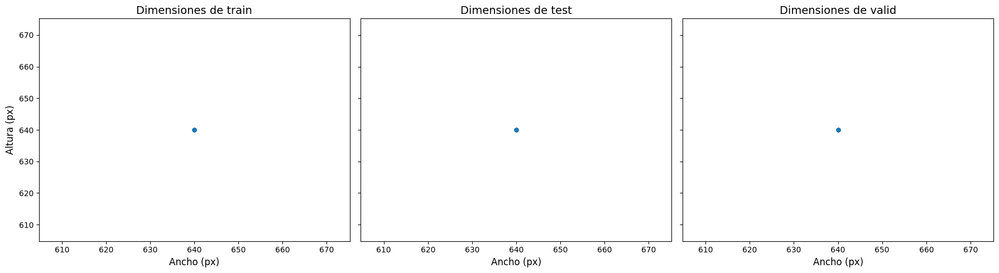

In [ ]:
folder = "/content/Container-Detection-7"

image_dimensions_scatterplot(folder)

# Configuración del dataset

In [ ]:
# configuración
ANNOTATION_FILE_NAME = "_annotations.coco.json"
train_directory = os.path.join(dataset.location, "train")
val_directory = os.path.join(dataset.location, "valid")
test_directory = os.path.join(dataset.location, "test")

# Clase personalizada COCO

Considerando que la data se descargo de Roboflow en formato COCO (*).

(*) COCO es un formato para especificar conjuntos de datos de detección, segmentación y subtitulación de objetos a gran escala.

info: información general sobre el conjunto de datos.

licenses : información de las licencias de imágenes del conjunto de datos.

images: lista de imágenes del conjunto de datos.

annotations: lista de anotaciones (incluidos los cuadros delimitadores) que están presentes en todas las imágenes del conjunto de datos.

categories: lista de categorías de etiquetas

In [ ]:
class CocoDetection(torchvision.datasets.CocoDetection):
        """
        Constructor de la clase CocoDetection.

        Inicializa la clase base 'CocoDetection' con la ruta al directorio de imágenes
        y la ruta al archivo de anotaciones (formato JSON). Además, almacena el procesador
        de imágenes para aplicarlo al preprocesamiento de datos.

        Args:
            image_directory_path (str): Ruta al directorio con las imágenes.
            image_processor (callable): Procesador de imágenes.
            train (bool): Indica si el dataset corresponde a entrenamiento (opcional).
        """

    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        """
        Obtiene un elemento del dataset preprocesado.

        Recupera la imagen y las anotaciones correspondientes a un índice dado,
        aplica el procesador de imágenes y devuelve los datos en un formato adecuado
        para su uso con modelos de detección de objetos.

        Args:
            idx (int): Índice del elemento a recuperar.

        Returns:
            pixel_values (torch.Tensor): Imagen preprocesada en formato tensor.
            target (dict): Diccionario que contiene las etiquetas procesadas
                           para los objetos presentes en la imagen.
        """

        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target

    def __len__(self):
        """
        Devuelve el tamaño total del dataset.

        Returns:
            int: Número total de imágenes en el dataset.
        """
        return len(self.ids)



In [ ]:
train_dataset = CocoDetection(
    image_directory_path=train_directory,
    image_processor=image_processor,
    train=True)
val_dataset = CocoDetection(
    image_directory_path=val_directory,
    image_processor=image_processor,
    train=False)
test_dataset = CocoDetection(
    image_directory_path=test_directory,
    image_processor=image_processor,
    train=False)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))
print("Number of test examples:", len(test_dataset))

Number of training examples: 1913
Number of validation examples: 188
Number of test examples: 89


Image #1309


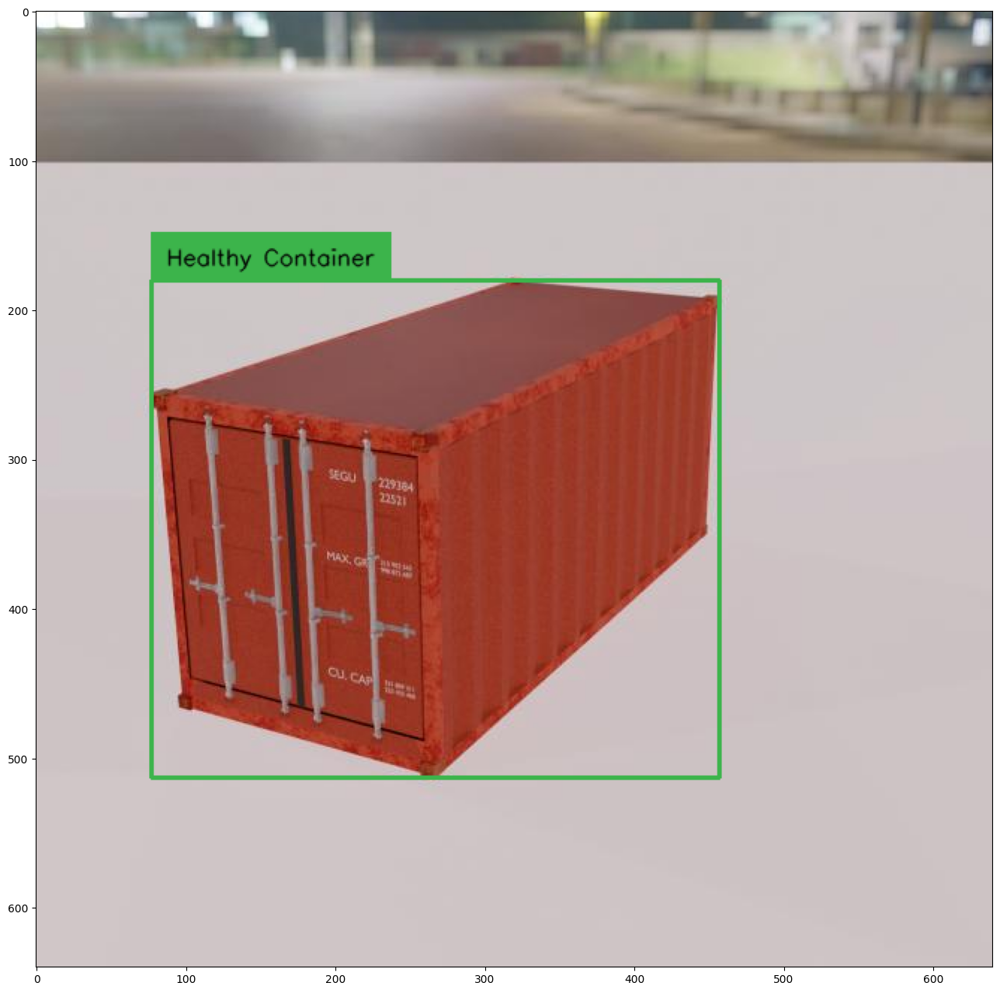

In [ ]:
# Configuración de la semilla para reproducibilidad
SEED = 42
random.seed(SEED)

# Selección de una imagen aleatoria
image_ids = train_dataset.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# Carga de la imagen junto a las anotaciones
image = train_dataset.coco.loadImgs(image_id)[0]
annotations = train_dataset.coco.imgToAnns[image_id]
image_path = os.path.join(train_dataset.root, image['file_name'])
image = cv2.imread(image_path)

# Anotación
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# Uso de la función id2label para el entrenamiento
categories = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    """
    Las imágenes se ajustan al mismo tamaño para que puedan ser procesadas en lotes.
    Las etiquetas se agrupan para ser utilizadas por el modelo durante el cálculo de las pérdidas.
    """

    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

# Preparación de los DataLoaders

In [ ]:
train_dataloader = DataLoader(dataset=train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset, collate_fn=collate_fn, batch_size=4)
test_dataloader = DataLoader(dataset=test_dataset, collate_fn=collate_fn, batch_size=4)

In [ ]:
class Detr(pl.LightningModule):
  """
  Esta clase permite construir el modelo organizado en diversos pasos

  __init__ Constructor

  forward -> Ejecutar los datos a traves del modelo

  training_step -> El entrenamiento

  validation_step -> La validación

  configure_optimizers -> Optimizador (settings)

  train_dataloader -> Carga de datos de entrenamiento

  val_dataloader -> Carga de datos de validación


  """

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=model_repo,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs para las metricas para cada training_step, y el promedio para la época
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):

        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return train_dataloader

    def val_dataloader(self):
        return val_dataloader

In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(train_dataloader))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

# Entrenamiento

In [ ]:
trainer = pl.Trainer(max_epochs=10, accumulate_grad_batches=8, log_every_n_steps=5)
trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | eval
--------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.008   Total estimated model params size (MB)
0         Modules in train mode
399       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
# Almacenamiento del modelo
trainer.save_checkpoint("detr_model.ckpt")

# Optionally, save the model's state_dict for more flexibility
torch.save(model.state_dict(), 'detr_model_state_dict.pth')

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

Error processing /content/Container-Detection-7/test/337_png.rf.66d603b4ce90ff230ded9f6e2cb36f2b.jpg: 'Detr' object has no attribute 'config'
Error processing /content/Container-Detection-7/test/462_png.rf.331611a7bee9c8dedd27f9a9e2b927ca.jpg: 'Detr' object has no attribute 'config'
Error processing /content/Container-Detection-7/test/531_png.rf.2238e8ea80e80ef7d7a0f4e6945a7f60.jpg: 'Detr' object has no attribute 'config'


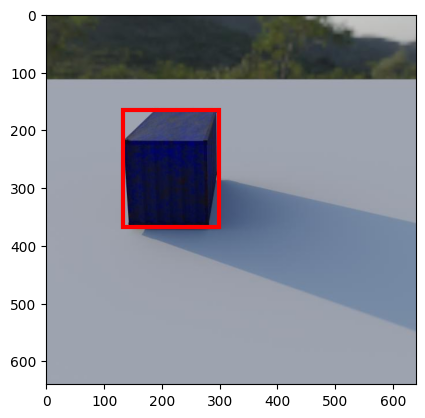

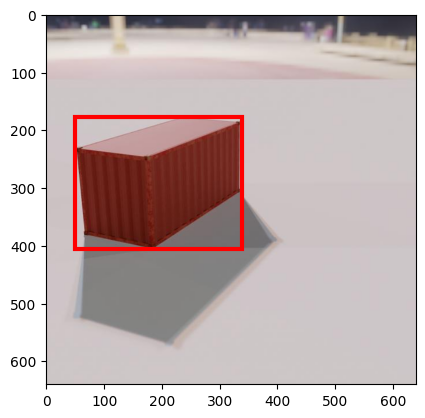

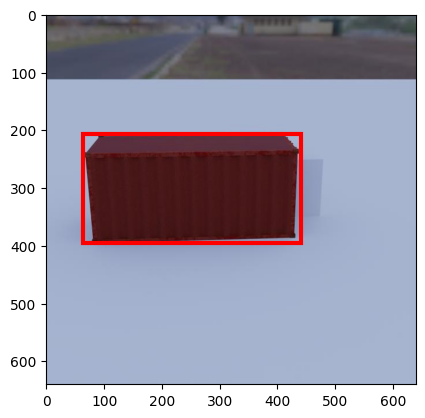

In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4) # Use your Detr class

# Carga y manejo del modelo

model.load_state_dict(torch.load('/content/detr_model_state_dict.pth'))
model.eval()
model.to("cuda") # Ensure model is on the correct device

image_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

# Función para el manejo de inferencia
def perform_inference(image_path):
    image = Image.open(image_path)

    inputs = image_processor(images=image, return_tensors="pt").to("cuda")
    outputs = model(**inputs)

    # proceso de la salida
    processed_outputs = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=[image.size[::-1]])[0]

    # Plot de la imagen con las cajas
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for score, label, box in zip(processed_outputs["scores"], processed_outputs["labels"], processed_outputs["boxes"]):
        box = [round(i, 2) for i in box.tolist()]
        ax.add_patch(plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color='red', linewidth=3))
        ax.text(box[0], box[1], f"{model.config.id2label[label.item()]}: {round(score.item(), 3)}", fontsize=12, color='white')
    plt.axis("off")
    plt.show()

# Performance de la inferencia para una muestra de tres imagenes
image_paths = [
    "/content/Container-Detection-7/test/337_png.rf.66d603b4ce90ff230ded9f6e2cb36f2b.jpg",
    "/content/Container-Detection-7/test/462_png.rf.331611a7bee9c8dedd27f9a9e2b927ca.jpg",
    "/content/Container-Detection-7/test/531_png.rf.2238e8ea80e80ef7d7a0f4e6945a7f60.jpg",
]

for image_path in image_paths:
    try:
      perform_inference(image_path)
    except Exception as e:
      print(f"Error processing {image_path}: {e}")

ssssss


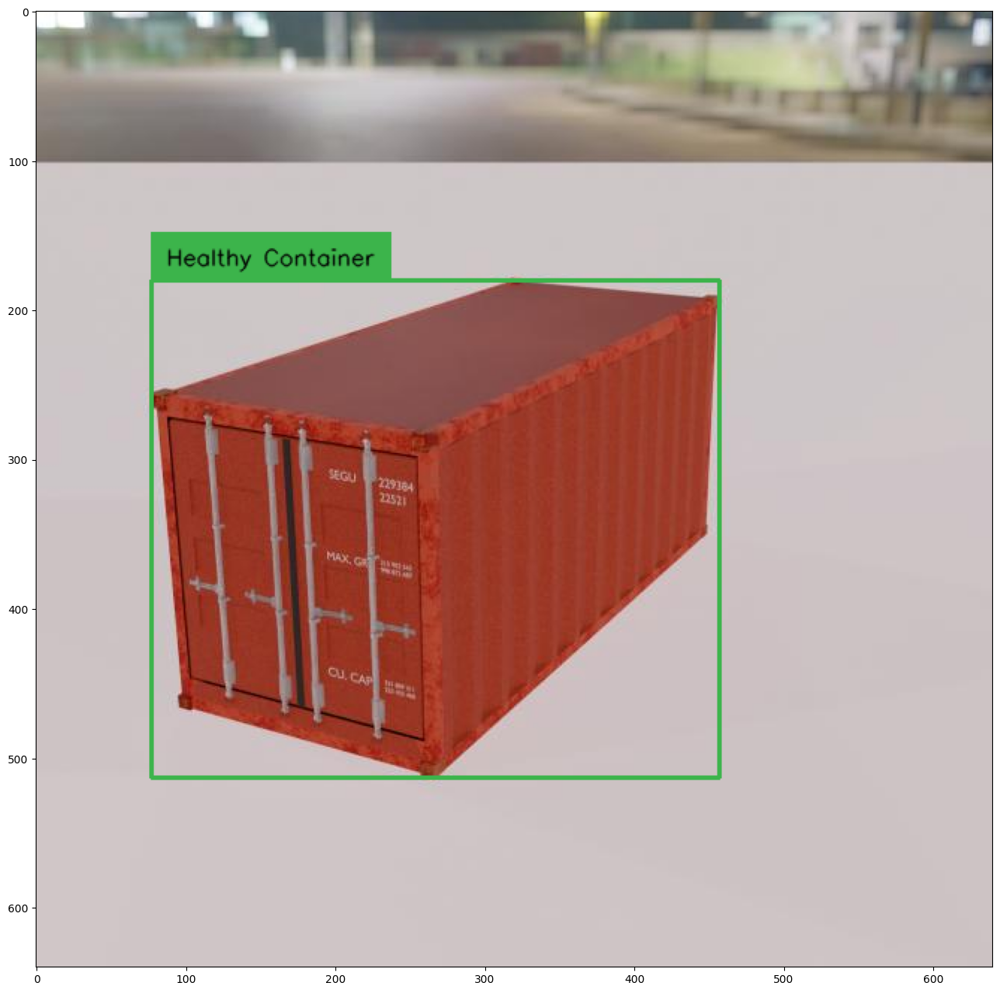

Detections


In [ ]:
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print("Ensayo Adicional")

sv.show_frame_in_notebook(image, (16, 16))


# Mas Inferencias
with torch.no_grad():
    inputs = image_processor(images=image, return_tensors='pt').to(device)
    outputs = model(**inputs)


    target_sizes = torch.tensor([image.shape[:2]]).to(device)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=conf_tresh,
        target_sizes=target_sizes
    )[0]


detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=iou_thesh)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)
print("Detections")

In [ ]:
model.to(device)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Image #14


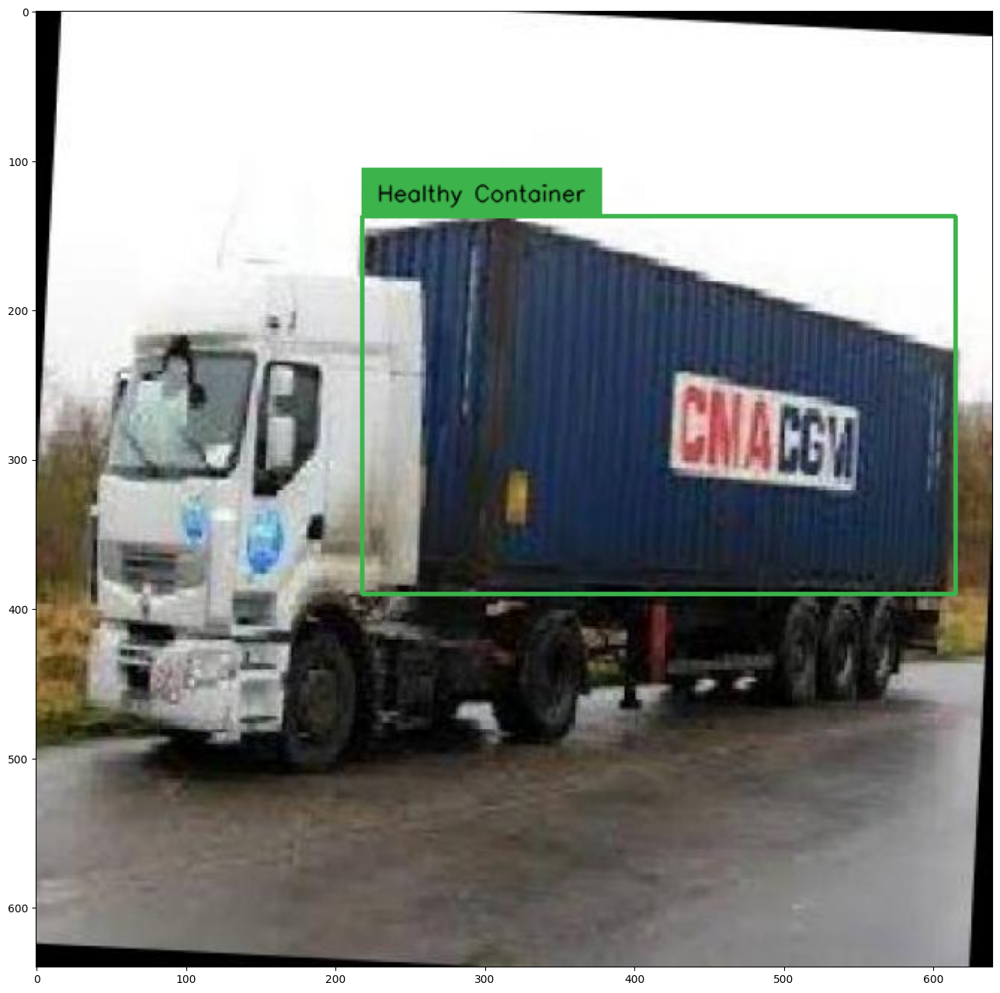

detections


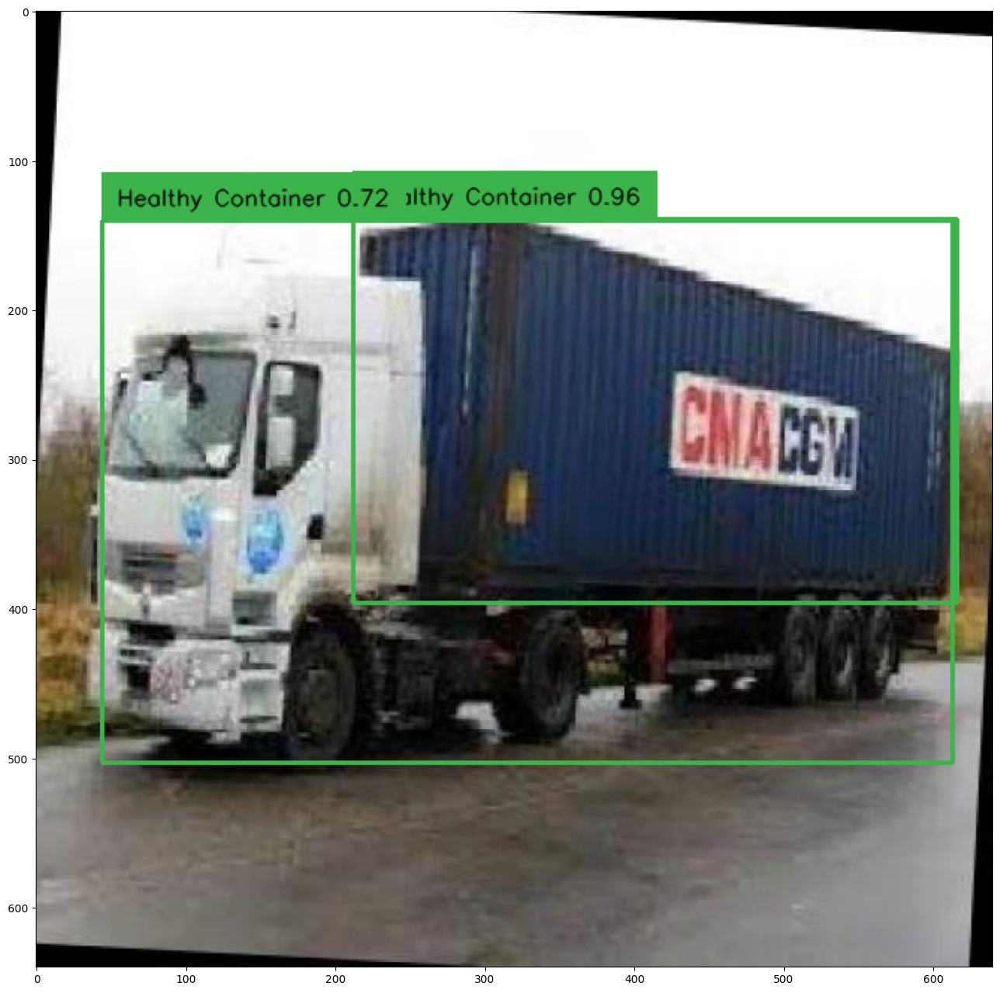

In [ ]:
categories = test_dataset.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# Selecciona una imagen al azar
image_ids = test_dataset.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# Carga la imagen y la anotación
image = test_dataset.coco.loadImgs(image_id)[0]
annotations = test_dataset.coco.imgToAnns[image_id]
image_path = os.path.join(test_dataset.root, image['file_name'])
image = cv2.imread(image_path)

# anotación
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)


%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

# inferencia
with torch.no_grad():

    # Carga la imagen y la predicción
    inputs = image_processor(images=image, return_tensors='pt').to(device)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(device)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=conf_tresh,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))


In [ ]:
!pip install -q coco_eval

  Preparing metadata (setup.py) ... done


In [ ]:
def convert_to_xywh(boxes):
    """Convierte la información de las cajas a una dimensión"""
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    """ Devuelve información en formato COCO """
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results


In [ ]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

evaluator = CocoEvaluator(coco_gt=test_dataset.coco, iou_types=["bbox"])

print("Running evaluation...")

for idx, batch in enumerate(tqdm(test_dataloader)):
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


  0%|          | 0/23 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.661
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.804
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.715
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.661
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.668
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.770
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.770
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area

Resultados destacados:

•	AP general: 66.1%

•	AP para IoU=0.50: 80.4%

•	AP para IoU=0.75: 71.5%

•	AR general: 77.0%
